In [15]:
import torch.nn as nn
from torchvision import models, transforms
import torch
import torchvision
from classifier_model import LinearWood

from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

from utils import *

device = 'cuda' if torch.cuda.is_available() else 'cpu'

In [16]:
# Sample image setup

# path
sample_path = r"Sample image//turtle.jpg"

# Open image, apply transforms: resize image, convert to pytorch tensor
sample = Image.open(sample_path)
tensor_transform = transforms.Compose(transforms= [transforms.Resize((256, 256)), transforms.ToTensor()])
sample_tensor = tensor_transform(sample)

# Unsqeeze to make a batch of 1
sample_tensor = torch.unsqueeze(sample_tensor, 0)


print(sample_tensor.grad)

None


In [17]:
# Load the model weights

model_weight_path = r"C://Users//rolan//Desktop//personal//Projects//DeepDream//Models//Experiment_1_2023-11-05_75.pth"
model_weights = torch.load(model_weight_path)

In [18]:
# Set up the classifier

model = LinearWood()
model.load_state_dict(model_weights)
model.to(device=device)
model.eval

<bound method Module.eval of LinearWood(
  (conv1): Conv2d(3, 6, kernel_size=(5, 5), stride=(2, 2))
  (maxpool1): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv2): Conv2d(6, 12, kernel_size=(3, 3), stride=(2, 2))
  (maxpool2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv3): Conv2d(12, 36, kernel_size=(3, 3), stride=(2, 2))
  (relu): ReLU()
  (dropout): Dropout2d(p=0.2, inplace=False)
  (linear_stack): Sequential(
    (0): Flatten(start_dim=1, end_dim=-1)
    (1): Linear(in_features=1296, out_features=512, bias=True)
    (2): ReLU()
    (3): Dropout(p=0.2, inplace=False)
    (4): Linear(in_features=512, out_features=64, bias=True)
    (5): ReLU()
    (6): Dropout(p=0.2, inplace=False)
    (7): Linear(in_features=64, out_features=4, bias=True)
    (8): Softmax(dim=1)
  )
)>

In [19]:
# layer to get activation
layer = model.conv1
layer_output = []

# Define a hook function -> return model 
def hook_activations(module, input, output):
    layer_output.append(output)

# Hook to the layer
hook = layer.register_forward_hook(hook_activations)

# Forward pass
sample_tensor = sample_tensor.to(device=device)
sample_tensor.requires_grad_(True)
output = model.forward(sample_tensor)

#unhook
hook.remove()

print(layer_output[0].shape)

torch.Size([1, 6, 126, 126])


In [20]:
# MSE loss
x = layer_output[0]
y = torch.zeros_like(x)

# Mse loss
mse_loss = nn.MSELoss()

# Get loss
loss = mse_loss(x, y)

loss.backward()

grad = sample_tensor.grad.data

print(grad.shape)

torch.Size([1, 3, 256, 256])


[[[0.50054526 0.5002428  0.50147074]
  [0.5000126  0.5010257  0.50319105]
  [0.498488   0.50082165 0.50330144]
  ...
  [0.5012248  0.5005898  0.50258666]
  [0.49966234 0.4978085  0.5025108 ]
  [0.5        0.5        0.5       ]]

 [[0.5006593  0.50172114 0.501431  ]
  [0.4995046  0.50096464 0.5030413 ]
  [0.5011122  0.5034319  0.501685  ]
  ...
  [0.49741885 0.49868107 0.5042237 ]
  [0.49959186 0.49839455 0.50019073]
  [0.5        0.5        0.5       ]]

 [[0.5015363  0.5005337  0.50328314]
  [0.49907434 0.5013654  0.5045721 ]
  [0.49739122 0.5020044  0.5078012 ]
  ...
  [0.5013206  0.49964768 0.5062613 ]
  [0.49691436 0.49711087 0.50079894]
  [0.5        0.5        0.5       ]]

 ...

 [[0.5006008  0.50073653 0.50288427]
  [0.49851662 0.4990544  0.5026763 ]
  [0.49925002 0.49900126 0.5025133 ]
  ...
  [0.4979682  0.5010605  0.5030457 ]
  [0.49813566 0.5005572  0.50045735]
  [0.5        0.5        0.5       ]]

 [[0.5004626  0.50178856 0.5013501 ]
  [0.49817604 0.49960983 0.500913  ]


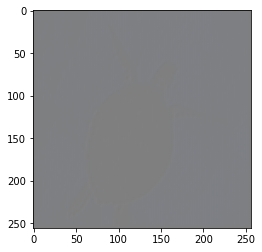

In [21]:
# Convert to numpy array

np_array = grad.cpu().numpy()[0]

# Move channels to the back for numpy
np_array = np_array.transpose(1, 2, 0)

# Print output in not scientific notation
np.set_printoptions(suppress=True)

# Scale the values from [-1..1] to [0..255]
np_array = ((np_array * 1000) + 1) / 2
print(np_array)

img = plt.imshow(np_array)

In [22]:
def array_to_tensor(array):

    # Transpose np array
    sample = array.transpose(2, 0, 1)

    # convert np_array to torch_tensor
    tensor = torch.from_numpy(sample)

    # Unsqeeze to make a batch of 1
    batch_tensor = torch.unsqueeze(tensor, 0)

    return batch_tensor

In [32]:
prediction = model(input)
activation = prediction.conv1
print(activation)

TypeError: conv2d() received an invalid combination of arguments - got (method, Parameter, Parameter, tuple, tuple, tuple, int), but expected one of:
 * (Tensor input, Tensor weight, Tensor bias, tuple of ints stride, tuple of ints padding, tuple of ints dilation, int groups)
      didn't match because some of the arguments have invalid types: (!method!, !Parameter!, !Parameter!, !tuple of (int, int)!, !tuple of (int, int)!, !tuple of (int, int)!, int)
 * (Tensor input, Tensor weight, Tensor bias, tuple of ints stride, str padding, tuple of ints dilation, int groups)
      didn't match because some of the arguments have invalid types: (!method!, !Parameter!, !Parameter!, !tuple of (int, int)!, !tuple of (int, int)!, !tuple of (int, int)!, int)


2.037692 -1.6456826


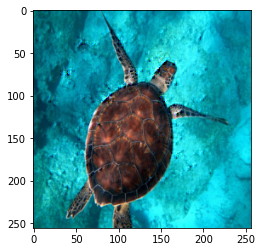

3.7511158 -3.7495546


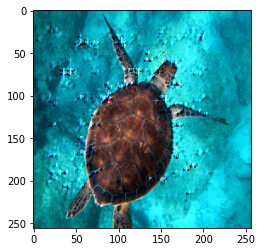

7.2134824 -6.807874


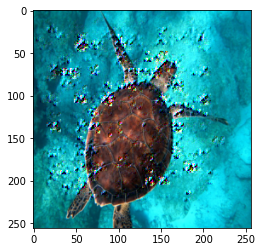

12.690024 -18.432177


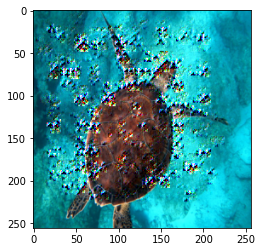

2.691231 -2.3486364


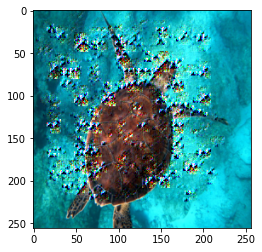

21.331915 -22.341139


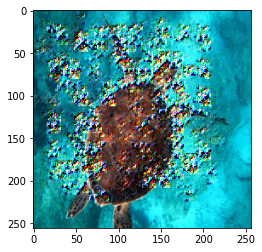

19.10325 -22.610989


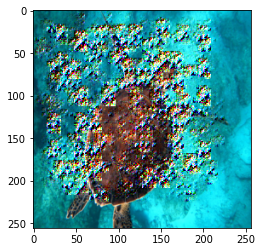

5.161652 -6.4611673


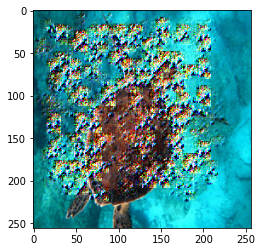

8.129319 -8.171246


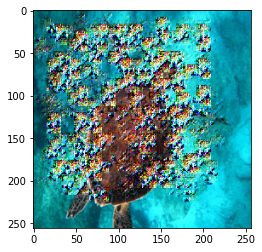

9.65561 -11.864603


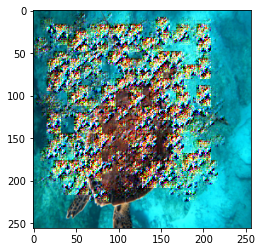

17.499811 -24.37587


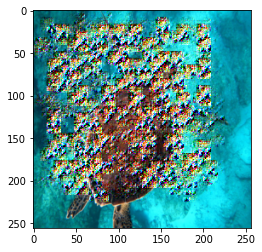

9.71997 -7.563489


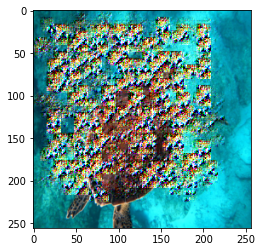

16.785315 -21.004799


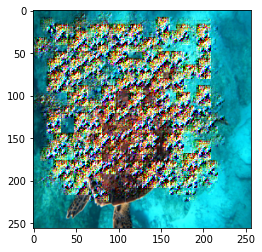

13.29666 -16.682297


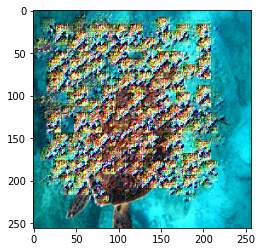

8.929047 -9.616063


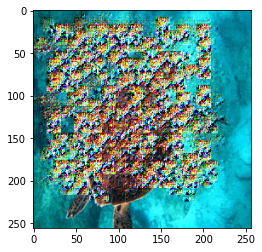

18.720705 -23.151735


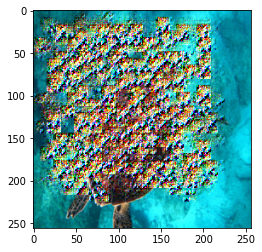

12.815097 -11.989752


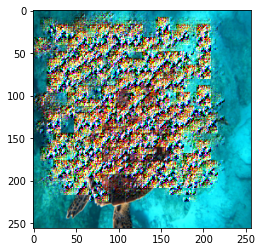

6.082299 -7.2455354


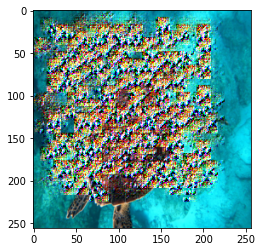

8.296141 -8.8301


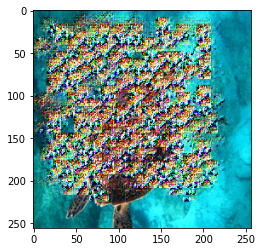

10.26671 -12.125237


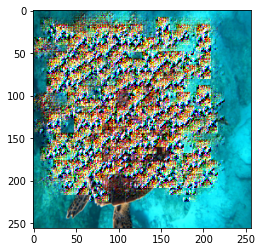

10.495104 -11.801459


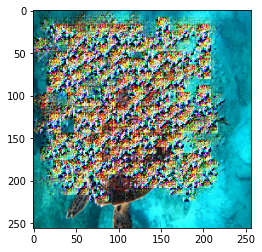

21.469044 -25.87454


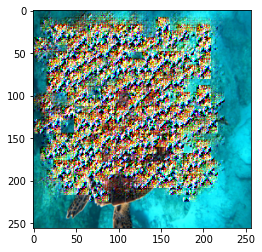

14.721762 -16.986462


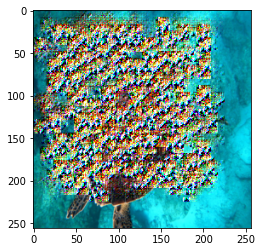

6.4904423 -8.294134


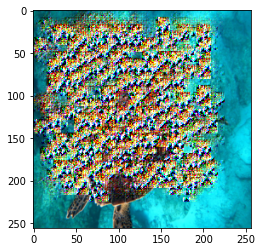

17.67263 -23.445896


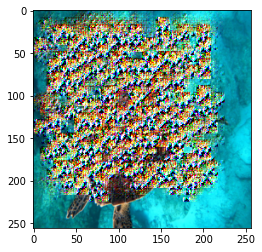

2.6101487 -3.4384131


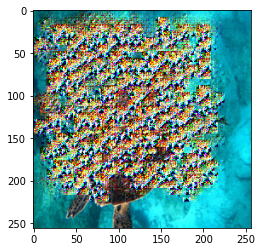

7.715984 -9.0574045


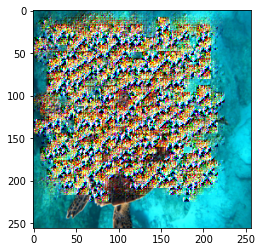

24.126097 -29.237873


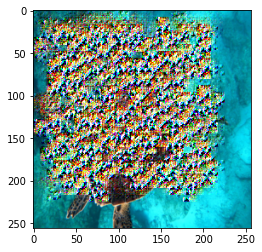

9.299553 -12.405874


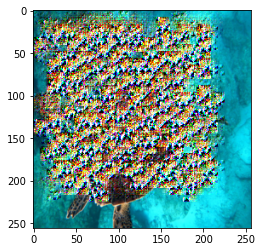

5.6594276 -5.1919675


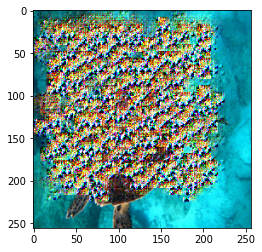

10.559484 -10.537362


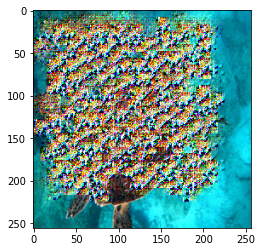

6.6839685 -6.386708


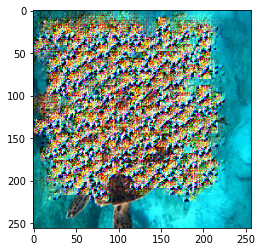

1.5093981 -1.7850108


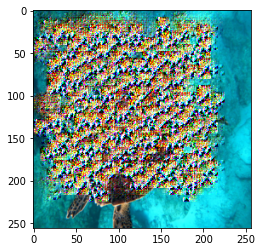

11.299526 -14.592653


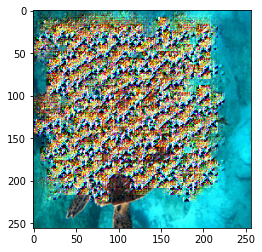

7.2672 -8.526331


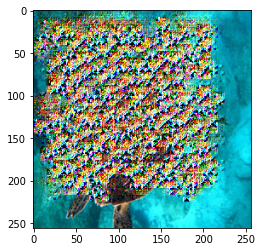

19.028091 -24.99251


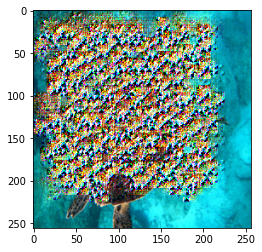

6.5409117 -8.817298


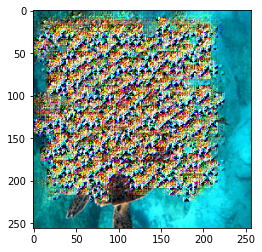

11.758864 -15.283075


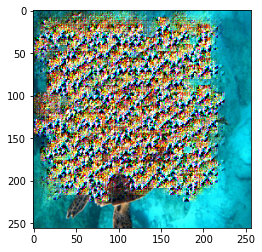

5.9963155 -8.300365


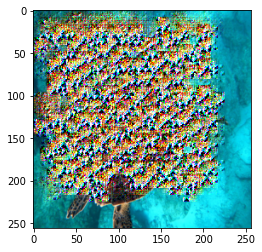

4.0947423 -4.7234864


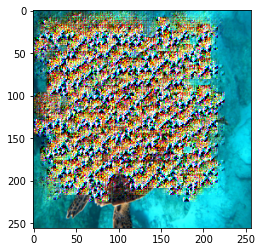

22.793713 -28.82089


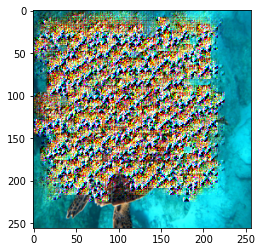

19.213182 -24.967398


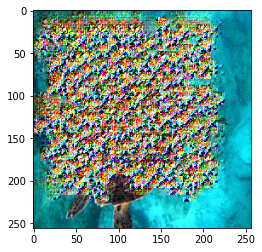

13.824179 -14.61707


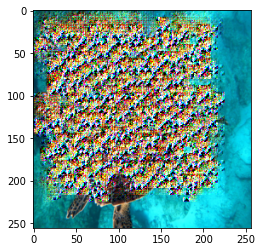

10.239896 -12.723213


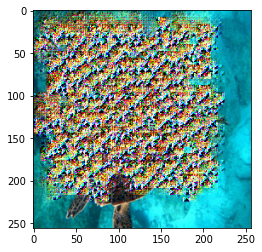

12.313531 -16.522015


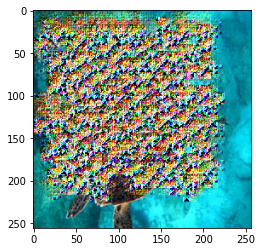

8.032022 -7.6306663


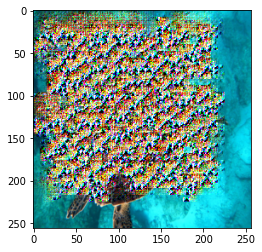

9.58448 -13.406613


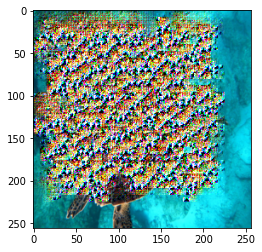

14.860131 -20.318617


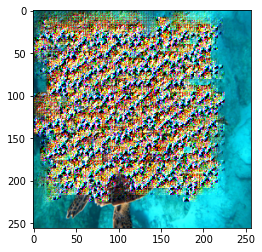

11.246397 -15.011048


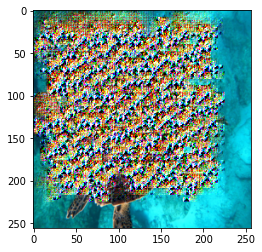

6.626822 -7.4732976


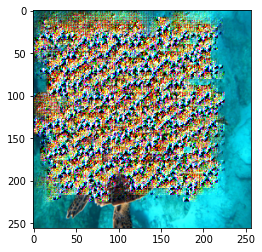

4.338295 -4.449419


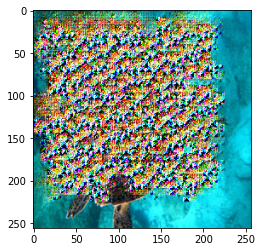

18.999626 -24.716694


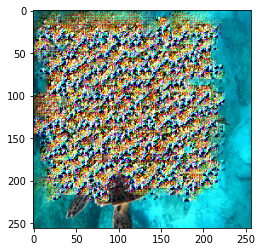

10.728552 -14.106767


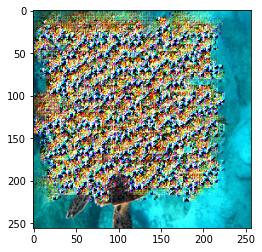

15.844152 -17.24667


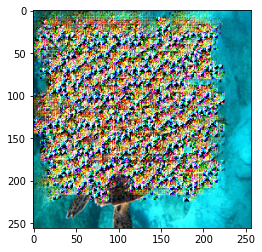

22.987566 -26.095915


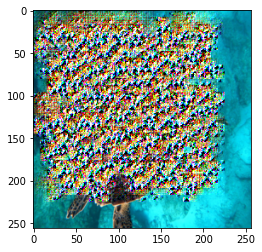

8.341989 -12.020232


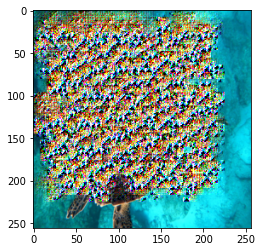

10.752095 -13.3357


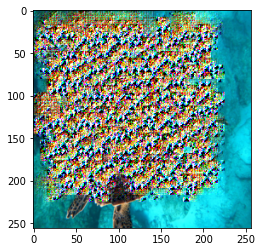

20.10061 -24.182241


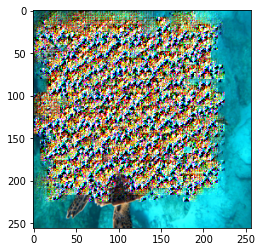

4.99567 -5.2520075


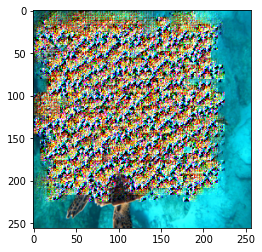

12.1512985 -16.140533


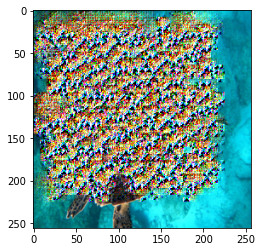

6.652843 -9.11319


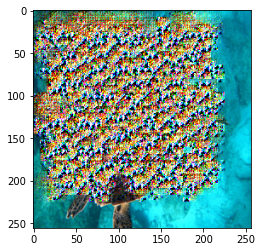

8.08593 -9.111219


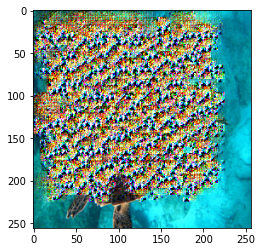

12.95422 -18.504318


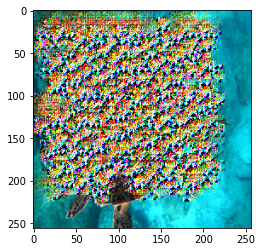

4.487428 -4.3563747


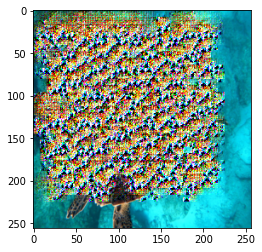

15.033232 -19.424635


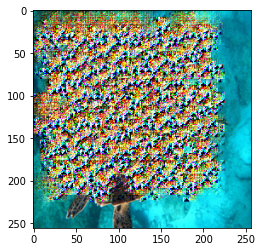

3.660319 -4.920608


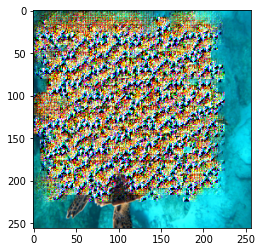

16.553814 -21.530268


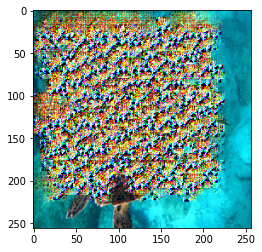

11.591512 -11.77492


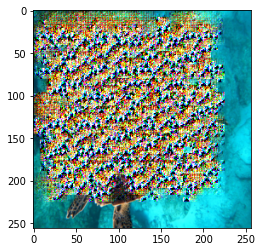

8.445946 -7.8133454


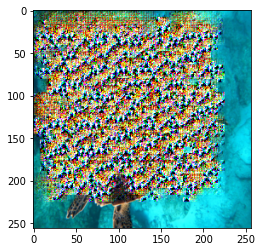

6.502832 -8.087763


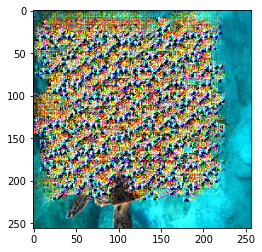

14.226344 -16.12296


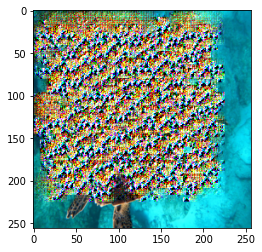

18.47542 -22.96865


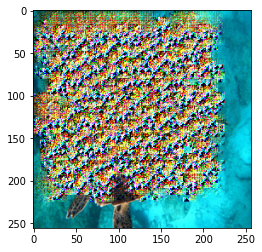

20.784084 -21.74037


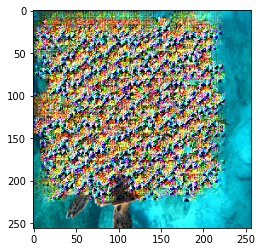

12.890071 -11.956506


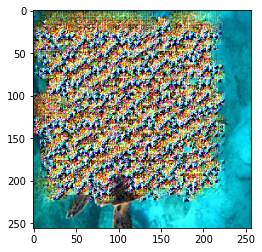

16.984398 -20.504683


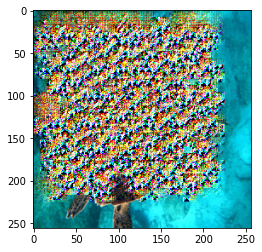

13.521081 -18.276033


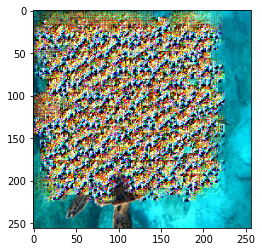

10.232268 -13.778769


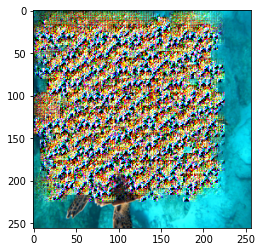

17.19886 -20.343834


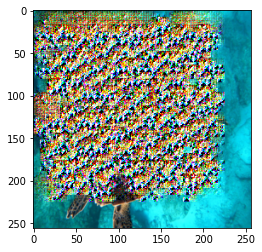

19.703098 -20.970566


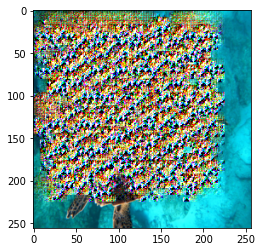

8.081678 -9.310684


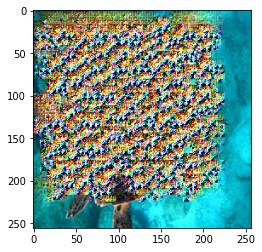

5.6968856 -5.7394443


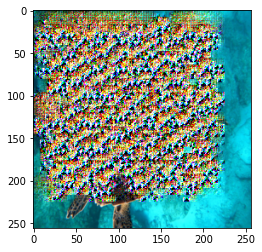

5.999668 -6.94075


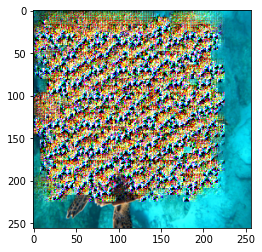

6.672205 -7.2556677


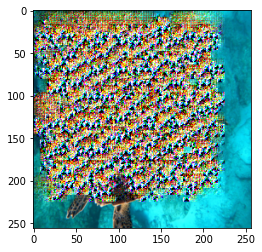

10.493626 -13.714567


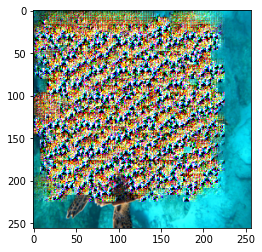

19.399937 -23.39963


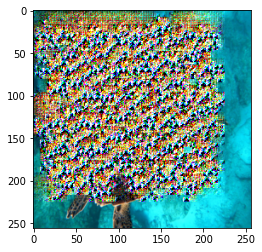

9.184366 -12.745279


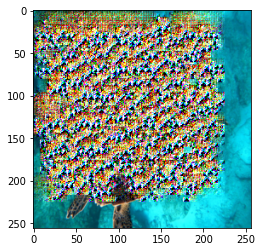

21.822098 -26.80022


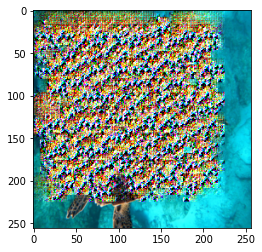

11.335595 -16.125736


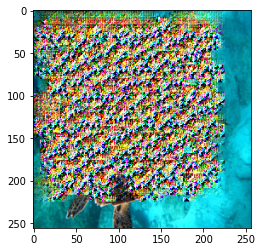

8.746753 -12.44589


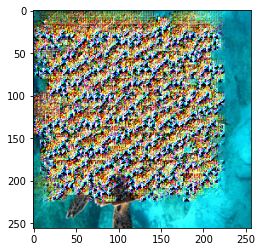

15.320486 -17.992395


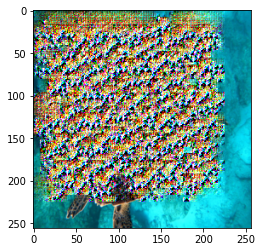

23.215712 -29.070723


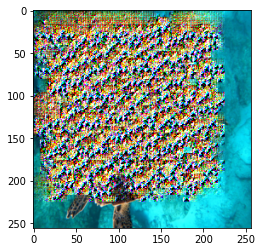

9.742107 -10.622641


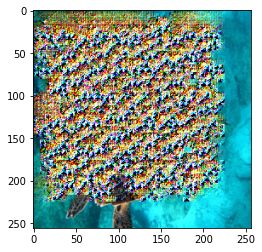

2.6619086 -3.007926


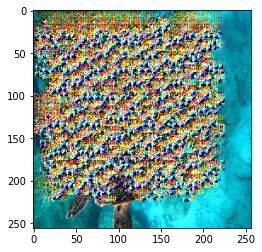

15.821255 -18.655798


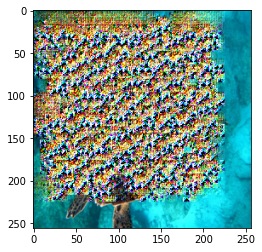

2.606729 -3.25391


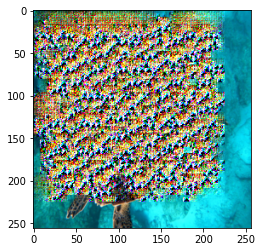

9.568948 -11.1919565


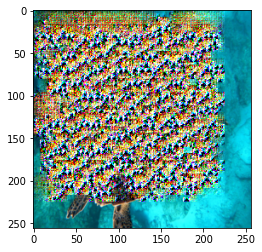

17.018906 -21.077686


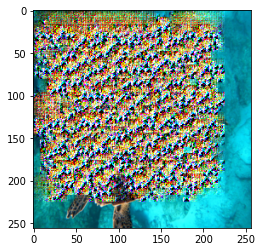

18.657446 -23.339891


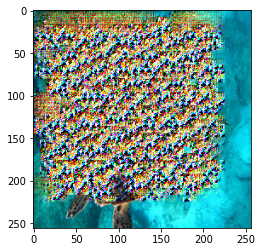

16.47226 -19.229622


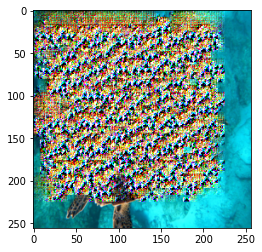

7.511203 -8.982415


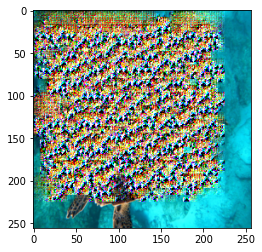

In [28]:
#%matplotlib inline

# Gradient ascent loop

# Get the activation maps from desired layers
layer = model.conv3

# Hook into the model
layer_outputs = []

def hook_function(model, input, output):
    #layer_outputs.append(output)
    hook_function.output = output
    pass

hook = layer.register_forward_hook(hook_function)

# hook.remove()
loss_fn = nn.MSELoss()

def gradient_ascent(start, iter_nr, model, input, loss_fn):

    if start >= iter_nr:
        return
    else:
        # Move input to device
        input = input.to(device=device)

        # Set gradient tracking
        input.requires_grad_(True)

        # Run the model
        prediction = model.forward(input)

        # Retrieve the hook output
        x = hook_function.output
        y = torch.zeros_like(x)

        # Move the hook to the GPU
        x = x.to(device=device)
        y = y.to(device=device)
        
        # Calculate the loss
        loss = loss_fn(x, y)

        # Calculate the gradients
        loss.backward()

        # Get the gradient for the input image
        gradients = input.grad.data

        # Convert the gradients to numpy
        grad_np_array = gradients[0].detach().cpu().numpy()
        grad_np_array = grad_np_array.transpose(1, 2, 0)
        grad_np_array = grad_np_array * 100 #((grad_np_array * 2000) + 1) / 2
        print(np.max(grad_np_array), np.min(grad_np_array))

        # Add the gradients to the original image
        og_image = input
        og_image_array = og_image[0].detach().cpu().numpy()
        og_image_array = og_image_array.transpose(1, 2, 0)

        updated_image_array = og_image_array + grad_np_array
        updated_image_array = np.clip(updated_image_array, 0, 1)

        # Remap the gradients so they don't add up to a white image

        # Convert the the otput to a batch tensor
        output = array_to_tensor(updated_image_array)

        # Clear the gradients
        input.grad.zero_()

        # Visualise the output
        img = plt.imshow(updated_image_array)
        plt.show()
        
        # set the recursion
        gradient_ascent(start + 1, iter_nr=iter_nr, model=model, input=output, loss_fn=loss_fn)

gradient_ascent(start=0, iter_nr=100, model=model, input=sample_tensor, loss_fn=loss_fn)

# test progressively upscaling the image
# start with 9x9 and then move to 256x256 in 247 steps increasing size by 1 pizel

In [ ]:
#Calculate MSE loss
#Smarter layer implementation